In [1]:
# Need to install ImageAnalysis3 and run the appropriate Startup_py3.py
%run "C:\Users\cosmosyw\Documents\Softwares\ImageAnalysis3\required_files\Startup_py3.py"
# append path to import ImageAnalysis3
sys.path.append(r"C:\Users\cosmosyw\Documents\Softwares")

import ImageAnalysis3 as ia
%matplotlib notebook

from ImageAnalysis3 import *
print(os.getpid())

import h5py
from ImageAnalysis3.classes import _allowed_kwds
import ast

import pandas as pd

PID number is 18900
18900


# Define file IO

In [2]:
postanalysis_folder = r'E:\DNA_analysis\Postanalysis_MeCP2'
if not os.path.exists(postanalysis_folder):
    os.mkdir(postanalysis_folder)
postanalysis_folder

'E:\\DNA_analysis\\Postanalysis_MeCP2'

In [3]:
codebook = pd.read_csv(r'\\10.245.74.158\Chromatin_NAS_8\Exported_data\20220713-Export\merged_codebook.csv')

In [4]:
chr2Zxys_filename = os.path.join(postanalysis_folder, 'all_chr2Zxys.pkl')

cellInfo_filename = os.path.join(postanalysis_folder, 'all_cellInfo.pkl')

if os.path.exists(chr2Zxys_filename):
    print(f"Loading: {chr2Zxys_filename}")
    chr2ZxysList = pickle.load(open(chr2Zxys_filename, 'rb'))
if os.path.exists(cellInfo_filename):
    print(f"Loading: {cellInfo_filename}")
    cellInfoList = pickle.load(open(cellInfo_filename, 'rb'))

Loading: E:\DNA_analysis\Postanalysis_MeCP2\all_chr2Zxys.pkl
Loading: E:\DNA_analysis\Postanalysis_MeCP2\all_cellInfo.pkl


# Partition by subclass

In [5]:
subclass_2_chr2ZxysList = {}
subclass_2_cellInfoList = {}
for _info, _chr2Zxys in zip(cellInfoList, chr2ZxysList):
    _cls = _info['subclass']+'_'+_info['MeCP2_genotype']
    if _cls not in subclass_2_chr2ZxysList:
        subclass_2_chr2ZxysList[_cls] = [_chr2Zxys]
        subclass_2_cellInfoList[_cls] = [_info]
    else:
        subclass_2_chr2ZxysList[_cls].append(_chr2Zxys)
        subclass_2_cellInfoList[_cls].append(_info)

In [6]:
for _cls in subclass_2_chr2ZxysList:
    print(_cls, len(subclass_2_chr2ZxysList[_cls]))

Oligo_WT 2503
Astro_WT 1476
Peri_WT 413
L6b_WT 379
L6b_KO 484
L6 CT_KO 4093
Astro_KO 2150
L6 CT_WT 2944
Endo-PVM_WT 1537
OPC_KO 455
Pvalb_KO 923
Pvalb_WT 695
Peri_KO 652
L6 IT_KO 1998
Vip_WT 285
Sncg_WT 117
Lamp5_KO 238
Sst_KO 628
L6 IT_WT 1363
Sncg_KO 132
Oligo_KO 3542
OPC_WT 348
Sst_WT 569
Vip_KO 307
SMC-VLMC_KO 285
SMC-VLMC_WT 181
L5/6 NP_WT 381
L5/6 NP_KO 600
L5 ET_KO 827
L5 ET_WT 560
Endo-PVM_KO 1508
Micro_KO 405
L5 IT_WT 1388
Micro_WT 394
L5 IT_KO 2067
Lamp5_WT 204
L4/5 IT_WT 868
L4/5 IT_KO 1575
L2/3 IT_WT 1606
L2/3 IT_KO 2665


In [7]:
subclass_2_chr2Zxys_filename = os.path.join(postanalysis_folder, 'subclass_2_chr2Zxys.pkl')
if not os.path.exists(subclass_2_chr2Zxys_filename):
    print(f"Saving: {subclass_2_chr2Zxys_filename}")
    pickle.dump(subclass_2_chr2ZxysList, open(subclass_2_chr2Zxys_filename, 'wb'))
    
subclass_2_cellInfo_filename = os.path.join(postanalysis_folder, 'subclass_2_cellInfo.pkl')
if not os.path.exists(subclass_2_cellInfo_filename):
    print(f"Saving: {subclass_2_cellInfo_filename}")
    pickle.dump(subclass_2_cellInfoList, open(subclass_2_cellInfo_filename, 'wb'))

### subclass to median

In [8]:
num_threads = 6

subclass_2_median_filename = os.path.join(postanalysis_folder, 'subclass_2_medianDict.pkl')
print(subclass_2_median_filename)

if os.path.exists(subclass_2_median_filename):
    print("Loading")
    subclass_2_medianDict = np.load(subclass_2_median_filename, allow_pickle=True)
else:
    from ImageAnalysis3.structure_tools.distance import Chr2ZxysList_2_summaryDist_by_key,Chr2ZxysList_2_summaryDict
    # calculate prob
    subclass_2_medianDict = {}
    for _subclass in subclass_2_chr2ZxysList:
        subclass_2_medianDict[_subclass] = Chr2ZxysList_2_summaryDict(
            subclass_2_chr2ZxysList[_subclass], 
            total_codebook=codebook, 
            num_threads=num_threads, verbose=True)
    
    print(f"Saving to: {subclass_2_median_filename}")
    pickle.dump(subclass_2_medianDict, open(subclass_2_median_filename, 'wb'))

E:\DNA_analysis\Postanalysis_MeCP2\subclass_2_medianDict.pkl
Loading


# Partition by majortypes

In [9]:
class_2_subclass_names = {
    'Gluta':['L6b', 'L6 CT', 'L6 IT', 'L5 IT', 'L4/5 IT', 'L2/3 IT', 'L5/6 NP', 'L5 ET', ],
    'GABA':['Sncg', 'Sst', 'Vip', 'Pvalb', 'Lamp5', ],
    'Astro':['Astro', ],
    'Endo':['Endo-PVM', 'SMC-VLMC', 'Peri'],
    'Micro':['Micro', ],
    'Oligo':['Oligo', 'OPC', ],
}
subclass_2_class = {}
class_2_subclass = {}
for _cls in class_2_subclass_names:
    class_2_subclass[_cls + '_' + 'WT'] = []
    class_2_subclass[_cls + '_' + 'KO'] = []
    for _subcls in class_2_subclass_names[_cls]:
        subclass_2_class[_subcls+'_'+'WT'] = _cls + '_' + 'WT'
        subclass_2_class[_subcls+'_'+'KO'] = _cls + '_' + 'KO'
        class_2_subclass[_cls + '_' + 'WT'].append(_subcls+'_'+'WT')
        class_2_subclass[_cls + '_' + 'KO'].append(_subcls+'_'+'KO')

In [10]:
# save if not exists
class_2_chr2ZxysList_filename = os.path.join(postanalysis_folder, 'class_2_chr2Zxys.pkl')
class_2_cellInfoList_filename = os.path.join(postanalysis_folder, 'class_2_cellInfo.pkl')

if not os.path.exists(class_2_chr2ZxysList_filename):
    # calculate
    class_2_chr2ZxysList = {_cls:[] for _cls in class_2_subclass.keys()}
    class_2_cellInfoList = {_cls:[] for _cls in class_2_subclass.keys()}

    for _subcls, _chr2ZxysList in subclass_2_chr2ZxysList.items():
        _cellInfoList = subclass_2_cellInfoList[_subcls]
        if _subcls in subclass_2_class:
            class_2_chr2ZxysList[subclass_2_class[_subcls]].extend(_chr2ZxysList)
            class_2_cellInfoList[subclass_2_class[_subcls]].extend(_cellInfoList)
    # plot stats
    for _cls in class_2_chr2ZxysList:
        print(_cls, len(class_2_chr2ZxysList[_cls]))
    # save
    print(f"Writing to file: {class_2_chr2ZxysList_filename}")
    pickle.dump(class_2_chr2ZxysList, open(class_2_chr2ZxysList_filename, 'wb'))
    print(f"Writing to file: {class_2_cellInfoList_filename}")
    pickle.dump(class_2_cellInfoList, open(class_2_cellInfoList_filename, 'wb'))

else:
    print("Loading")
    class_2_chr2ZxysList = pickle.load(open(class_2_chr2ZxysList_filename, 'rb'))
    class_2_cellInfoList = pickle.load(open(class_2_cellInfoList_filename, 'rb'))

Gluta_WT 9489
Gluta_KO 14309
GABA_WT 1870
GABA_KO 2228
Astro_WT 1476
Astro_KO 2150
Endo_WT 2131
Endo_KO 2445
Micro_WT 394
Micro_KO 405
Oligo_WT 2851
Oligo_KO 3997
Writing to file: E:\DNA_analysis\Postanalysis_MeCP2\class_2_chr2Zxys.pkl
Writing to file: E:\DNA_analysis\Postanalysis_MeCP2\class_2_cellInfo.pkl


In [4]:
class_2_median_filename = os.path.join(postanalysis_folder, 'class_2_medianDict.pkl')
print(class_2_median_filename)

if os.path.exists(class_2_median_filename):
    print("Loading")
    class_2_medianDict = np.load(class_2_median_filename, allow_pickle=True)
else:
    from ImageAnalysis3.structure_tools.distance import Chr2ZxysList_2_summaryDist_by_key,Chr2ZxysList_2_summaryDict
    # calculate prob
    class_2_medianDict = {}
    for _class in class_2_chr2ZxysList:
        class_2_medianDict[_class] = Chr2ZxysList_2_summaryDict(
            class_2_chr2ZxysList[_class], 
            total_codebook=codebook, 
            num_threads=num_threads, verbose=True)
    
    print(f"Saving to: {class_2_median_filename}")
    pickle.dump(class_2_medianDict, open(class_2_median_filename, 'wb'))

E:\DNA_analysis\Postanalysis_MeCP2\class_2_medianDict.pkl
Loading


# Plot

In [5]:
import ImageAnalysis3.structure_tools.distance as distance
codebook_df = codebook.copy()
figure_folder = r'E:\DNA_analysis\Postanalysis_MeCP2\median_maps\majorTypes'

<IPython.core.display.Javascript object>


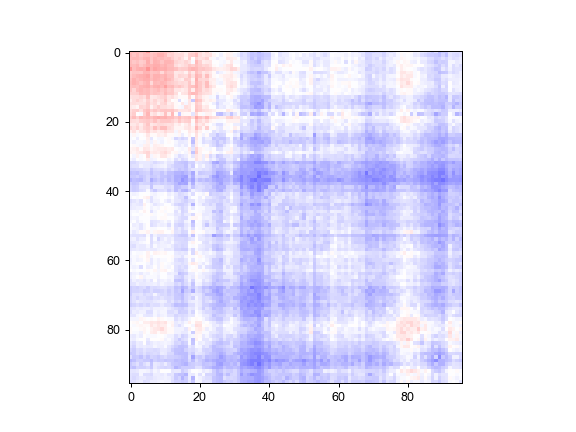

In [11]:
plt.figure()
plt.imshow(class_2_medianDict['Gluta_WT']['trans_7'], cmap='seismic_r', vmin=0.5, vmax=6)
plt.show()

<IPython.core.display.Javascript object>


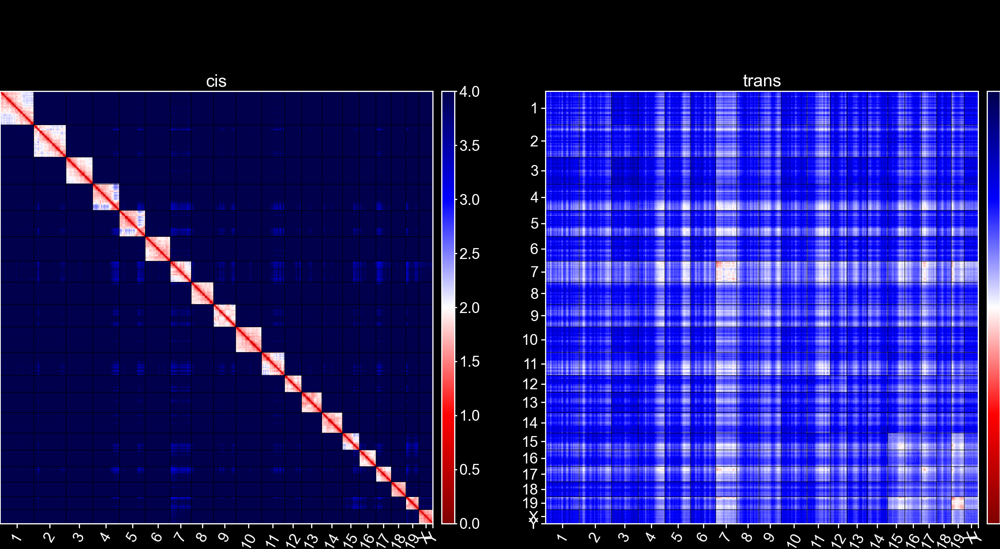

In [11]:
%matplotlib notebook
#%matplotlib inline
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = codebook_df
sort_by_region = False

_class = r'Gluta_WT'
summary_dict = class_2_medianDict[_class]

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, codebook_df, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
_trans_mat_wt, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    summary_dict, codebook_df, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=300, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat, color_limits=[0,4],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat_wt, color_limits=[1,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

#fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
#fig.suptitle(f"{_class}, N={len(class_2_chr2ZxysList[_class])}", fontsize=10, y=0.97)
#fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}_high_contrast.png"))
fig.show()

<IPython.core.display.Javascript object>


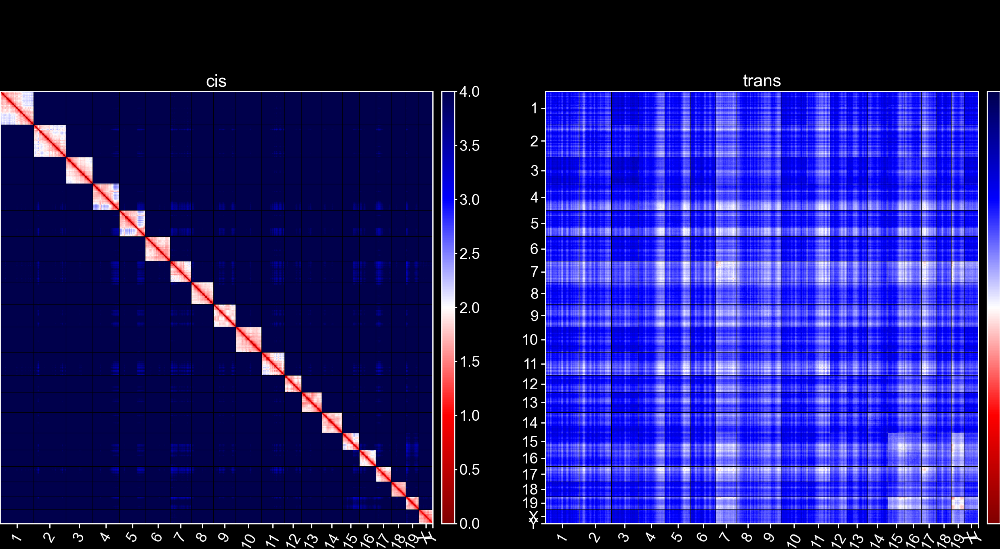

In [12]:
%matplotlib notebook
#%matplotlib inline
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = codebook_df
sort_by_region = False

_class = r'Gluta_KO'
summary_dict = class_2_medianDict[_class]

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, codebook_df, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
_trans_mat_ko, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    summary_dict, codebook_df, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=300, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat, color_limits=[0,4],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat_ko, color_limits=[1,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

#fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
#fig.suptitle(f"{_class}, N={len(class_2_chr2ZxysList[_class])}", fontsize=10, y=0.97)
#fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}_high_contrast.png"))
fig.show()

<IPython.core.display.Javascript object>


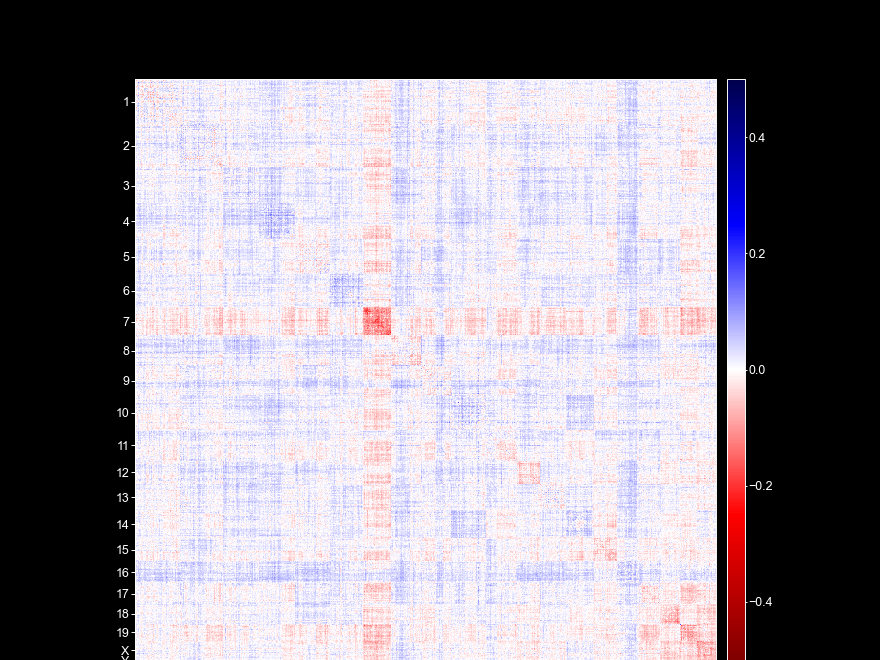

In [14]:
fig = plt.figure()
ax = fig.add_subplot(111)
ia.figure_tools.distmap.plot_distance_map(np.log2(_trans_mat_wt/_trans_mat_ko), color_limits=[-0.5,0.5],
                                          ax=ax, 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

plt.show()

<IPython.core.display.Javascript object>


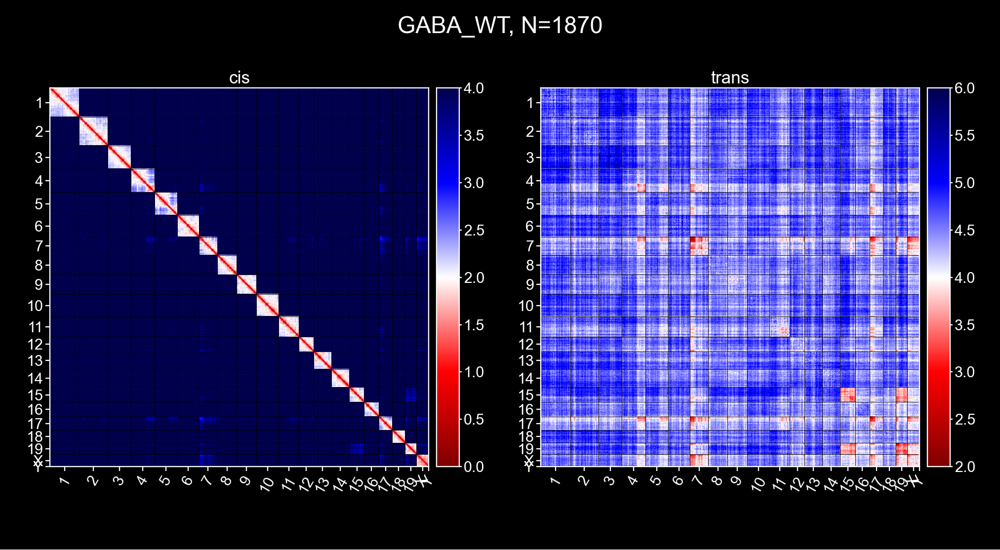

In [15]:
%matplotlib notebook
#%matplotlib inline
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = codebook_df
sort_by_region = False

_class = r'GABA_WT'
summary_dict = class_2_medianDict[_class]

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, codebook_df, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
_trans_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    summary_dict, codebook_df, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=300, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat, color_limits=[0,4],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat, color_limits=[2,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
fig.suptitle(f"{_class}, N={len(class_2_chr2ZxysList[_class])}", fontsize=10, y=0.97)
fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}_high_contrast.png"))
fig.show()

<IPython.core.display.Javascript object>


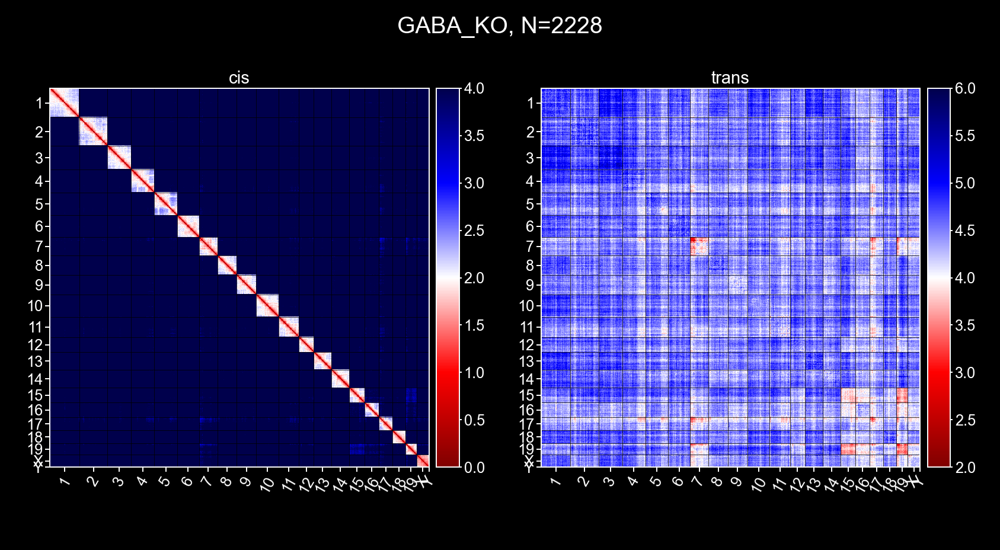

In [16]:
%matplotlib notebook
#%matplotlib inline
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = codebook_df
sort_by_region = False

_class = r'GABA_KO'
summary_dict = class_2_medianDict[_class]

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, codebook_df, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
_trans_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    summary_dict, codebook_df, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=300, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat, color_limits=[0,4],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat, color_limits=[2,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
fig.suptitle(f"{_class}, N={len(class_2_chr2ZxysList[_class])}", fontsize=10, y=0.97)
fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}_high_contrast.png"))
fig.show()

<IPython.core.display.Javascript object>


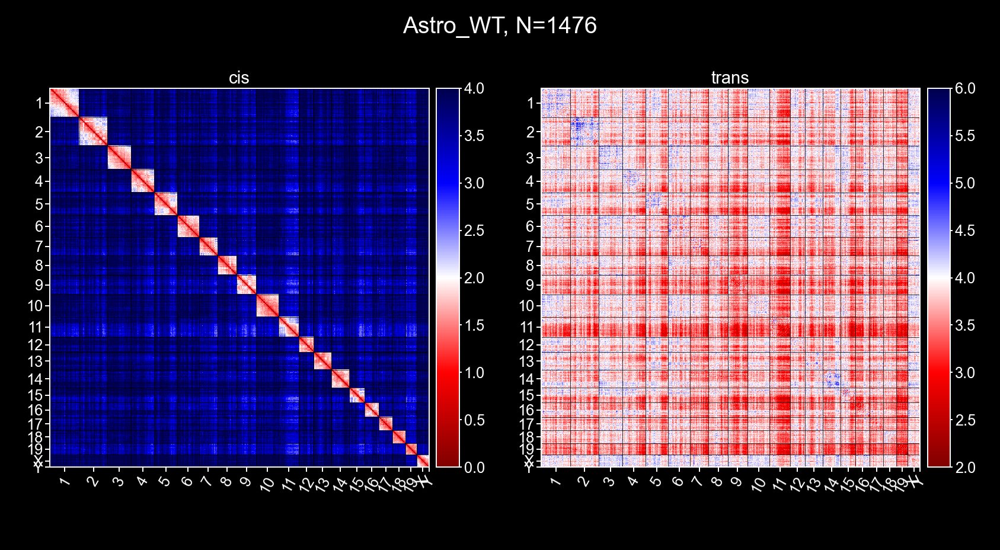

In [17]:
%matplotlib notebook
#%matplotlib inline
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = codebook_df
sort_by_region = False

_class = r'Astro_WT'
summary_dict = class_2_medianDict[_class]

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, codebook_df, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
_trans_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    summary_dict, codebook_df, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=300, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat, color_limits=[0,4],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat, color_limits=[2,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
fig.suptitle(f"{_class}, N={len(class_2_chr2ZxysList[_class])}", fontsize=10, y=0.97)
fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}_high_contrast.png"))
fig.show()

<IPython.core.display.Javascript object>


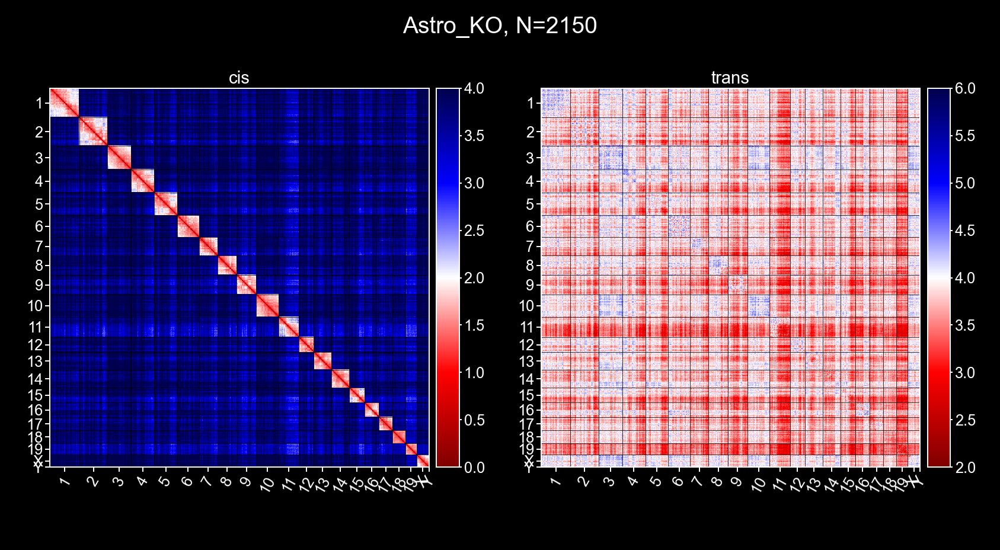

In [18]:
%matplotlib notebook
#%matplotlib inline
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = codebook_df
sort_by_region = False

_class = r'Astro_KO'
summary_dict = class_2_medianDict[_class]

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, codebook_df, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
_trans_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    summary_dict, codebook_df, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=300, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat, color_limits=[0,4],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat, color_limits=[2,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
fig.suptitle(f"{_class}, N={len(class_2_chr2ZxysList[_class])}", fontsize=10, y=0.97)
fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}_high_contrast.png"))
fig.show()

<IPython.core.display.Javascript object>


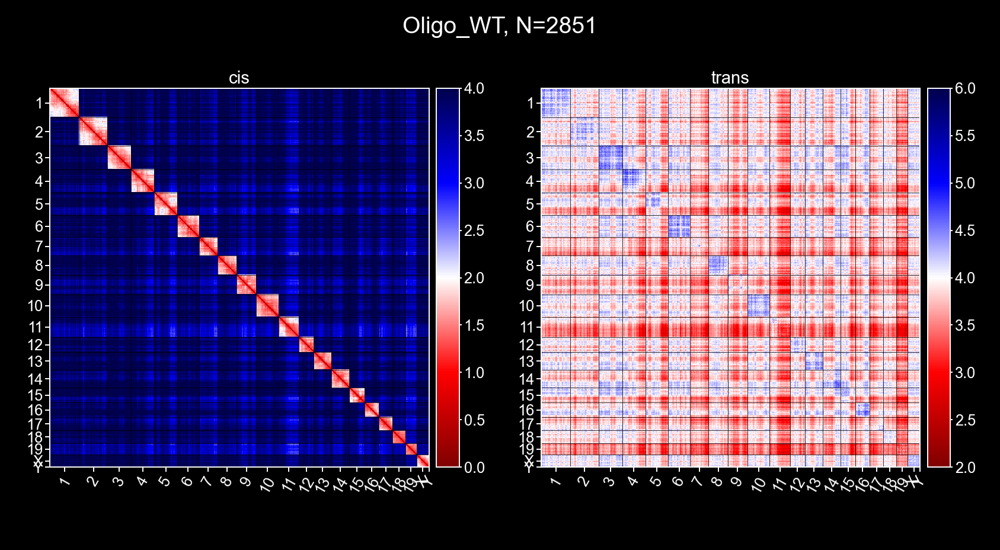

In [19]:
%matplotlib notebook
#%matplotlib inline
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = codebook_df
sort_by_region = False

_class = r'Oligo_WT'
summary_dict = class_2_medianDict[_class]

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, codebook_df, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
_trans_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    summary_dict, codebook_df, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=300, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat, color_limits=[0,4],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat, color_limits=[2,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
fig.suptitle(f"{_class}, N={len(class_2_chr2ZxysList[_class])}", fontsize=10, y=0.97)
fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}_high_contrast.png"))
fig.show()

<IPython.core.display.Javascript object>


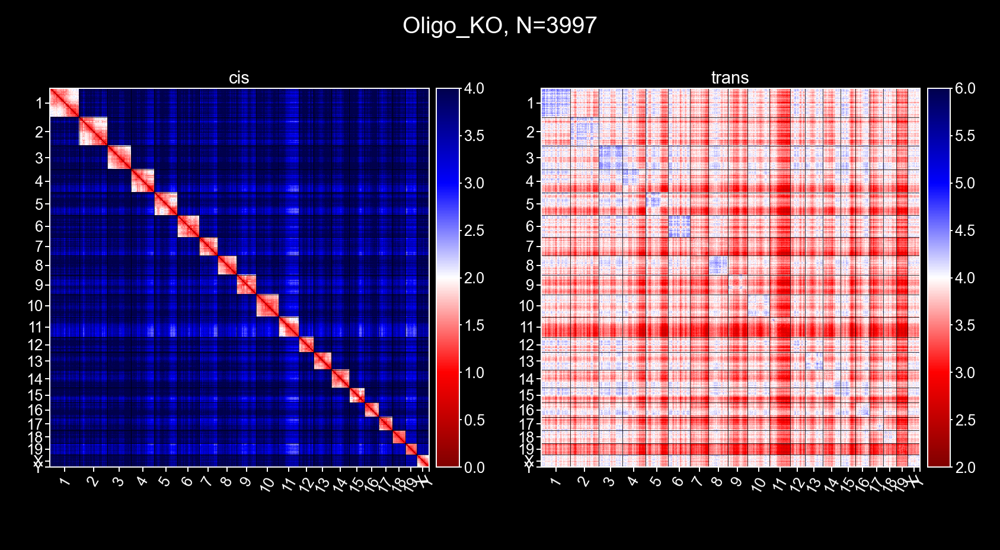

In [20]:
%matplotlib notebook
#%matplotlib inline
plt.style.use('dark_background')
_single_im_size=3
sel_codebook = codebook_df
sort_by_region = False

_class = r'Oligo_KO'
summary_dict = class_2_medianDict[_class]

_cis_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
        summary_dict, codebook_df, 
        sel_codebook=sel_codebook, 
        use_cis=True, sort_by_region=sort_by_region,
    )
_trans_mat, chr_edges, chr_names = distance.assemble_ChrDistDict_2_Matrix(
    summary_dict, codebook_df, 
    sel_codebook=sel_codebook, 
    use_cis=False, use_trans=True, sort_by_region=sort_by_region,
)

fig, axes = plt.subplots(1, 2, figsize=(_single_im_size*2, _single_im_size*1.1), dpi=300, sharex=True, sharey=True)

ia.figure_tools.distmap.plot_distance_map(_cis_mat, color_limits=[0,4],
                                          ax=axes[0], 
                                            ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names,
                                          font_size=6.5)
ia.figure_tools.distmap.plot_distance_map(_trans_mat, color_limits=[2,6],
                                          ax=axes[1], 
                                          ticks=(chr_edges[1:] + chr_edges[:-1])/2,
                                          tick_labels=chr_names, 
                                          font_size=6.5)

axes[0].set_title(f'cis', fontsize=7.5, pad=2)
axes[1].set_title(f'trans', fontsize=7.5, pad=2)
for _ax in axes:
    _ax.hlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.vlines(chr_edges-0.5, 0, len(_cis_mat), color='black', linewidth=0.2)
    _ax.xaxis.set_tick_params(which='both', labelbottom=True)
    _ax.yaxis.set_tick_params(which='both', labelleft=True)

fig.subplots_adjust(wspace=0.2, hspace=0.2, left=0.05, right=0.95, top=0.97, bottom=0.02)
fig.suptitle(f"{_class}, N={len(class_2_chr2ZxysList[_class])}", fontsize=10, y=0.97)
fig.savefig(os.path.join(figure_folder, f"cis-trans-median_distmap_byreg_{_class.replace('/','_')}_high_contrast.png"))
fig.show()